# 소상공인시장진흥공단_상가업소정보_201906

* https://www.data.go.kr/dataset/15012005/fileData.do

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# 노트북 안에서 그래프를 표시하기 위해
%matplotlib inline

plt.rc('font',family='D2Coding')

In [3]:
shop_2019 = pd.read_csv('../data/소상공인시장진흥공단_상가업소정보_201906_01.csv')
shop_2019.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,19911397,커피빈코리아선릉로93길점,코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010100106960042022041,NaN,서울특별시 강남구 선릉로93길 6,135080,6149.0,NaN,1,NaN,127.047883,37.505675
1,19911801,프로포즈,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1154510200101620001017748,NaN,서울특별시 금천구 가산로 34-6,153010,8545.0,NaN,1,NaN,126.899220,37.471711
2,19912201,싱싱커피&토스트,NaN,Q,음식,Q07,패스트푸드,Q07A10,토스트전문,I56192,...,2653010400105780000002037,산업용품유통상가,부산광역시 사상구 괘감로 37,617726,46977.0,NaN,1,26,128.980455,35.159774
3,19905471,와라와라호프,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1168010600106040000014378,대치상가,서울특별시 강남구 남부순환로 2933,135280,6280.0,NaN,1,NaN,127.061026,37.493922
4,19932756,가락사우나내스낵,NaN,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,S96121,...,1171010500102560005010490,NaN,서울특별시 송파구 가락로 71,138846,5690.0,NaN,1,NaN,127.104071,37.500249


In [4]:
shop_2019.shape

(565016, 39)

In [5]:
coffee = shop_2019[shop_2019['상권업종소분류명'].str.contains('커피')]
coffee.shape

(23103, 39)

In [6]:
coffee.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [7]:
# 상호명으로 봤을 때 커피점이 15205개가 있다.
coffee['상호명'].unique().shape

(15205,)

In [8]:
coffee['상호명'].value_counts()

간단하지만특별한화피디Cafe    1477
이디야커피               538
스타벅스                370
투썸플레이스              165
커피빈                 153
엔제리너스               134
할리스커피               124
카페베네                110
탐앤탐스                109
커피베이                104
공차                   99
쥬씨                   93
빽다방                  92
커피에반하다               76
파스쿠찌                 69
요거프레소                69
커피나무                 58
토프레소                 56
컴포즈커피                52
쥬스식스                 52
커피하우스                46
더카페                  45
커피마마                 45
더벤티                  43
메가커피                 42
설빙                   39
할리스                  35
셀렉토커피                33
커피니                  30
마리웨일237              28
                   ... 
스윗패턴즈                 1
샤넬                    1
이디야커피가든파이브            1
시월에                   1
커피엔스타                 1
35커피                  1
쉠락에프앤비                1
커피베이종암점               1
찰스커피                  1
그라제난닥스                1
라임스트리트커피일기      

In [9]:
coffee[coffee['상호명']=='간단하지만특별한화피디Cafe']

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
7789,22729790,간단하지만특별한화피디Cafe,에델리아하이마트점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010600105090000027515,하이마트사옥,서울특별시 강남구 삼성로 156,135280,6288.0,NaN,1,NaN,127.063815,37.494233
13663,20012278,간단하지만특별한화피디Cafe,카그뮤지컬예당점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1165010800114640022021146,호경빌딩,서울특별시 서초구 남부순환로 2395,137070,6711.0,NaN,NaN,NaN,127.012347,37.480667
15550,20659435,간단하지만특별한화피디Cafe,드마린논현점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010800102210017008042,엘크루빌딩,서울특별시 강남구 논현로 636,135010,6107.0,NaN,1,NaN,127.032971,37.510465
26169,22698069,간단하지만특별한화피디Cafe,루이스신사점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010800100040021006003,NaN,서울특별시 강남구 논현로149길 62,135010,6039.0,NaN,1,NaN,127.023566,37.516974
43549,20833165,간단하지만특별한화피디Cafe,셀렉토스타점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1129013900103490001000001,장위뉴타워,서울특별시 성북구 화랑로 248,136820,2787.0,NaN,NaN,NaN,127.056891,37.610395
46554,20561131,간단하지만특별한화피디Cafe,그랑KT부산정보통신센터점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,2617010400108300029014046,KT부산정보통신센터,부산광역시 동구 자성공원로 23,601706,48745.0,NaN,2,NaN,129.062479,35.137738
46827,3182203,간단하지만특별한화피디Cafe,모아가산점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1154510100100600073015862,벽산디지털밸리5차,서울특별시 금천구 벚꽃로 244,153788,8513.0,NaN,NaN,108,126.885794,37.476748
53037,23428519,간단하지만특별한화피디Cafe,H무역점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010500101590007016829,무역센터현대백화점,서울특별시 강남구 테헤란로 517,135730,6164.0,NaN,NaN,NaN,127.059745,37.508608
65282,23253872,간단하지만특별한화피디Cafe,마마스미니현대압구정점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168011000104290000005000,현대백화점본점,서울특별시 강남구 압구정로 165,135724,6001.0,NaN,NaN,NaN,127.027447,37.527359
65369,19979480,간단하지만특별한화피디Cafe,드구띠에역삼점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010100108280007024608,한동빌딩사옥,서울특별시 강남구 테헤란로8길 37,135080,6239.0,NaN,1,NaN,127.032438,37.496557


In [10]:
coffee.loc[coffee['상호명'].str.contains('스타벅스'), '상호명'].unique()

array(['스타벅스', '스타벅스종로3가점', '스타벅스커피여의도IFC1F', '스타벅스신림사거리점', '스타벅스커피홍대역',
       '스타벅스새문안로점', '스타벅스올림픽평화의문점', '스타벅스연신내역', '스타벅스연세백양로점',
       '스타벅스가락시장역점', '스타벅스외대점', '스타벅스석촌역', '스타벅스명지대점', '스타벅스압구정로데오역',
       '스타벅스연대동문', '스타벅스강남삼성타운점', '스타벅스사당점', '스타벅스신림점', '스타벅스서울대입구역점',
       '스타벅스광장점', '스타벅스신촌명물거리점', '스타벅스명동미래', '스타벅스건국클래식점', '스타벅스연희DT점',
       '스타벅스삼선교점', '스타벅스종각점', '스타벅스올림픽공원북문점', '스타벅스커피여의도호성', '스타벅스충정타워',
       '스타벅스방배카페입구', '스타벅스이수역점', '스타벅스W-MALL점', '스타벅스용산역점', '스타벅스마포일진빌딩점',
       '스타벅스천호로데오점', '스타벅스중계역점', '스타벅스명동메트로', '스타벅스마포아크로타워점',
       '스타벅스남부터미널2점', '스타벅스구로디지털로점', '스타벅스중랑구청점', '스타벅스종로관수점', '스타벅스논현힐탑',
       '스타벅스부산서면', '스타벅스삼성도심공항점', '스타벅스종로2가점', '스타벅스선정릉역점', '스타벅스선릉로점',
       '스타벅스명동역', '스타벅스미아역점', '스타벅스역삼럭키', '스타벅스커피신도림디큐브시티B2',
       '스타벅스이태원거리점', '스타벅스구로에이스트윈타워1점', '스타벅스을지로입구', '스타벅스교대역점',
       '스타벅스서울중앙우체국점', '스타벅스구로하이엔드점', '스타벅스남산스테이트', '스타벅스목동점', '스타벅스삼성교점',
       '스타벅스조선호텔후문', '스타벅스명일이마트점', '스타벅스커리학동사거리점', '스타벅스서울교대점',
       '스타벅스강북구청사거리점', '스타벅스청

In [11]:
coffee['시도명'].isnull().sum()

0

In [12]:
# 다른 지역을 참고하고 싶다면 같은 폴더에 있는 다른 파일을 참고해 주세요.
coffee['시도명'].value_counts()

서울특별시    18341
부산광역시     4762
Name: 시도명, dtype: int64

In [13]:
coffee['시군구명'].unique()

array(['강남구', '영등포구', '중구', '서초구', '성북구', '구로구', '마포구', '종로구', '도봉구',
       '북구', '남구', '기장군', '광진구', '서대문구', '은평구', '해운대구', '양천구', '용산구',
       '관악구', '성동구', '사상구', '금천구', '송파구', '동대문구', '사하구', '강서구', '금정구',
       '동작구', '중랑구', '강북구', '강동구', '수영구', '연제구', '노원구', '부산진구', '동구',
       '동래구', '영도구', '서구'], dtype=object)

In [14]:
coffee['상권업종중분류명'].value_counts()

커피점/카페    23103
Name: 상권업종중분류명, dtype: int64

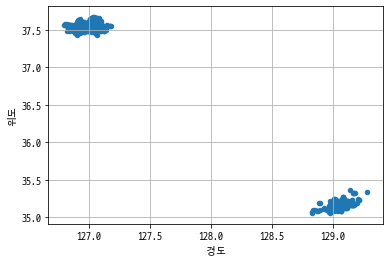

In [15]:
shop_2019[:1000].plot.scatter(x="경도", y="위도", grid="True")

In [16]:
df_seoul = shop_2019.loc[shop_2019['시도명'].str.startswith('서울')].copy()
df_seoul.shape

(401071, 39)

In [17]:
df_seoul.isnull().sum()

상가업소번호            0
상호명               0
지점명          344270
상권업종대분류코드         0
상권업종대분류명          0
상권업종중분류코드         0
상권업종중분류명          0
상권업종소분류코드         0
상권업종소분류명          0
표준산업분류코드      23587
표준산업분류명       23587
시도코드              0
시도명               0
시군구코드             0
시군구명              0
행정동코드             0
행정동명              0
법정동코드             0
법정동명              0
지번코드              0
대지구분코드            0
대지구분명             0
지번본번지             0
지번부번지         75924
지번주소              0
도로명코드             0
도로명               0
건물본번지             0
건물부번지        354031
건물관리번호            0
건물명          205736
도로명주소             0
구우편번호             0
신우편번호             2
동정보          369770
층정보          125634
호정보          343797
경도                0
위도                0
dtype: int64

In [18]:
df_seoul['상권업종대분류명'].value_counts()

음식          131687
소매          124782
생활서비스        64344
학문/교육        31247
의료           18826
부동산          15430
관광/여가/오락     11578
숙박            3047
스포츠            130
Name: 상권업종대분류명, dtype: int64

In [19]:
df_seoul.describe(include=np.object)

,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,표준산업분류명,...,법정동명,대지구분명,지번주소,도로명,건물관리번호,건물명,도로명주소,동정보,층정보,호정보
count,401071,56801,401071,401071,401071,401071,401071,401071,377484,377484,...,401071,401071,401071,401071,401071,195335,401071,31301,275437,57274
unique,274470,20473,9,9,94,94,696,696,211,211,...,465,2,127572,11941,128106,26219,127287,975,139,2680
top,점프셈교실,강남점,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,I56111,한식 음식점업,...,역삼동,대지,서울특별시 종로구 종로6가 262-1,서울특별시 서초구 신반포로,1111016400102700003012054,동대문종합시장,서울특별시 종로구 종로 266,1,1,1
freq,1743,494,131687,131687,41243,41243,27110,27110,50833,50833,...,11866,400708,978,3531,1010,1020,997,5457,178422,6479


In [20]:
df_seoul[['위도', '경도']].describe(include=np.number)

,위도,경도
count,401071.000000,401071.000000
mean,37.544965,126.996983
std,0.048108,0.080574
min,37.434081,126.768169
25%,37.505431,126.928061
50%,37.541162,127.012732
75%,37.571921,127.057331
max,37.692398,127.182588


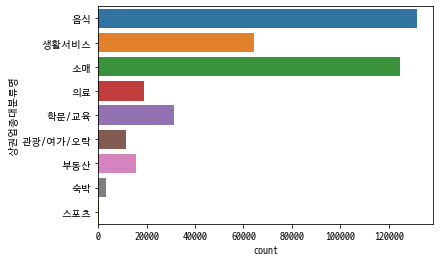

In [21]:
sns.countplot(data=df_seoul, y="상권업종대분류명")

In [22]:
df_food = df_seoul.loc[
    df_seoul['상권업종대분류명'].str.contains('음식')]
df_food.shape

(131687, 39)

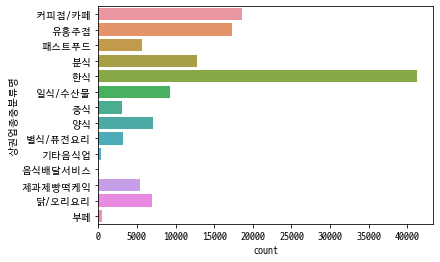

In [23]:
sns.countplot(data=df_food, y="상권업종중분류명")

## 퀴즈

#### '상권업종중분류명'이 '패스트푸드'인 데이타프레임 df_fast_food 을 정의하여라 
#### '상권업종중분류명'이 '패스트푸드'인 데이타프레임의 상호명은 모두 몇개인가?
#### '상권업종중분류명'이 '패스트푸드'인 데이타프레임에서 가장 많은 상호명은?
#### 서울에 있는 '피자'가 포함된 상호명 목록을 출력하여라
#### 서울 강남구에 있는 도미노피자의 지점명을 모두 출력하여라

In [24]:
df_fast_food = df_food.loc[df_food['상권업종중분류명'] == '패스트푸드']
df_fast_food.shape

(5683, 39)

In [25]:
df_food.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [26]:
df_fast_food['상호명'].value_counts()

배스킨라빈스31        131
피자스쿨            120
던킨도너츠           111
한솥도시락            90
롯데리아             87
한솥               81
베스킨라빈스           72
이삭토스트            70
버거킹              66
피자마루             64
도미노피자            64
맥도날드             59
59피자             59
배스킨라빈스           58
피자헛              56
본도시락             46
미스터피자            44
파파존스피자           37
피자나라치킨공주         35
봉구스밥버거           33
써브웨이             31
요거프레소            30
피자알볼로            30
명랑핫도그            25
맘스터치             24
명랑시대쌀핫도그         24
크라제버거            20
서브웨이             20
임실치즈피자           20
석봉토스트            19
               ... 
한스피자              1
신일상사              1
요거프레소창동역점         1
롯데리아장안사거리점        1
한국피자헛약수2호점        1
봉구스밥버거여의도중앙점      1
피자몰청량점            1
PIZZAALVOLO       1
에이비씨치킨&러브브        1
피자스쿨갈현점           1
보떼가젤라또            1
피자무쪼              1
스테프핫도그2호          1
피자마루서울대점          1
지트                1
피자애상봉역점           1
베스킨라빈스목동2단지점      1
삐꼴로두에꼬제           1
맛난쌀핫도그            1


In [27]:
df_fast_food['상호명'].value_counts()

배스킨라빈스31        131
피자스쿨            120
던킨도너츠           111
한솥도시락            90
롯데리아             87
한솥               81
베스킨라빈스           72
이삭토스트            70
버거킹              66
피자마루             64
도미노피자            64
맥도날드             59
59피자             59
배스킨라빈스           58
피자헛              56
본도시락             46
미스터피자            44
파파존스피자           37
피자나라치킨공주         35
봉구스밥버거           33
써브웨이             31
요거프레소            30
피자알볼로            30
명랑핫도그            25
맘스터치             24
명랑시대쌀핫도그         24
크라제버거            20
서브웨이             20
임실치즈피자           20
석봉토스트            19
               ... 
한스피자              1
신일상사              1
요거프레소창동역점         1
롯데리아장안사거리점        1
한국피자헛약수2호점        1
봉구스밥버거여의도중앙점      1
피자몰청량점            1
PIZZAALVOLO       1
에이비씨치킨&러브브        1
피자스쿨갈현점           1
보떼가젤라또            1
피자무쪼              1
스테프핫도그2호          1
피자마루서울대점          1
지트                1
피자애상봉역점           1
베스킨라빈스목동2단지점      1
삐꼴로두에꼬제           1
맛난쌀핫도그            1


In [28]:
df_seoul['상호명'][df_seoul['상호명'].str.contains('피자')].shape

(1857,)

In [29]:
df_seoul['상호명'][df_seoul['상호명'].str.contains('피자')].unique()

array(['피자마루', '솔로몬피자', '시장피자', '피자', '59피자', '도미노피자오금점', '피자스쿨', '피자에땅',
       '명품피자치킨', '피자헛', '도미노피자이문점', '피자클럽킴스', '피자스쿨장승배기', '도미노피자',
       '대장장이화덕피자', '피자글릭', '피자스쿨망우우림시장점', '카니발피자', '아이피자', '미스터피자신림녹두점',
       '빨간모자피자가좌점', '피자알볼로오류점', '미스터피자', '토니피자치킨족발', '빈스피자', '이태리피자',
       '빅마켓피자코트', '피자포유', '피자26', '디에이피자', '피자스쿨신월1호점', '피자굿망우우림점',
       '피자일마지오', '빨간고추피자', '피자알볼로옥수점', '코스트피자', '피자헛홍대본점', '밀라노피자',
       '모이또피자', '피자와김밥천국', '한국피자헛한티역', '제임스시카고피자', '영구스피자', '7번가피자',
       '한명숙피자펍', '피자샵', '빨간모자피자', '피자데이치킨데이', '조아피자', '왕서방피자', '피니치니피자',
       '수드피자', '우리집피자,돈치킨', '폴피자', '피자헤븐', '임실치즈피자', '피자스쿨본사', '피자세계',
       '피자나라치킨공주', '뽕뜨락피자', '명품임실치즈피자', '뽕뜨락피자점구로1점', '피자토비', '피자헛약수점',
       '리버티스피자', '명품임실피자', '피자스쿨송파1호점', '피자스쿨풍납점', '피자알볼로', '피자바람',
       '피자일일구', '나폴리피자치킨', '수피자', '준피자앤즉석떡볶이', '피자와치킨의러브레터', '피자몰',
       '조선피자', '피자애', '한스피자', '강정구의피자생각', '피자스쿨당산점', '계동피자',
       '이랜드크루즈피자몰노들', '논스톱피자치킨', '피자투어', '빨간모자피자명일점', '피자굼터',
       '강정구의피자생각광진점', '피자토랑', '피자헛중계

In [30]:
df_seoul[(df_seoul['시군구명']=='강남구') & (df_seoul['상호명'].str.contains('도미노피자'))]

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
15637,20561849,도미노피자,일원점,Q,음식,Q07,패스트푸드,Q07A01,피자전문,I56192,...,1168011400106870007002760,NaN,서울특별시 강남구 일원로9길 18,135230,6343.0,NaN,1,NaN,127.083096,37.489635
60151,20419152,도미노피자,역삼점,Q,음식,Q07,패스트푸드,Q07A01,피자전문,I56192,...,1168010100107210036023754,태현빌딩,서울특별시 강남구 언주로 413,135080,6222.0,NaN,1,NaN,127.043581,37.499828
95331,20019922,도미노피자,압구정점,Q,음식,Q07,패스트푸드,Q07A01,피자전문,I56192,...,1168010700106380002009656,NaN,서울특별시 강남구 압구정로 306,135896,6017.0,NaN,1,NaN,127.034736,37.528843
164850,20089674,도미노피자,삼성점,Q,음식,Q07,패스트푸드,Q07A01,피자전문,I56192,...,1168010500100440018016108,NaN,서울특별시 강남구 봉은사로 451,135090,6097.0,NaN,1,NaN,127.048990,37.512036
169394,25972841,도미노피자,개포점,Q,음식,Q07,패스트푸드,Q07A04,패스트푸드,I56199,...,1168011800109430000000288,뱅뱅빌딩,서울특별시 강남구 강남대로 292,135270,6258.0,1,4,NaN,127.032180,37.489364
298384,20027266,도미노피자,NaN,Q,음식,Q07,패스트푸드,Q07A01,피자전문,I56192,...,1168010100107790008024869,NaN,서울특별시 강남구 언주로 315,135080,6229.0,NaN,5,NaN,127.045508,37.495915
357569,20029019,도미노피자개포점,개포점,Q,음식,Q07,패스트푸드,Q07A01,피자전문,I56192,...,1168010300102280003020819,동진빌딩,서울특별시 강남구 논현로 58,135240,6312.0,NaN,1,NaN,127.047203,37.475547
463327,12087838,도미노피자역삼점,역삼점,Q,음식,Q07,패스트푸드,Q07A01,피자전문,I56192,...,1168010100107890000025387,동아빌딩,서울특별시 강남구 역삼로 146,135080,6249.0,NaN,1,NaN,127.035337,37.494508


In [31]:
df_seoul[(df_seoul['시군구명']=='강남구') & (df_seoul['상호명'].str.contains('도미노피자'))]['지점명']

15637      일원점
60151      역삼점
95331     압구정점
164850     삼성점
169394     개포점
298384     NaN
357569     개포점
463327     역삼점
Name: 지점명, dtype: object

In [32]:
df_seoul[(df_seoul['시군구명']=='강남구') & (df_seoul['상호명'].str.contains('도미노피자')) & (df_seoul['지점명'].isnull())]

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
298384,20027266,도미노피자,NaN,Q,음식,Q07,패스트푸드,Q07A01,피자전문,I56192,...,1168010100107790008024869,NaN,서울특별시 강남구 언주로 315,135080,6229.0,NaN,5,NaN,127.045508,37.495915


# 배스킨라빈스와 던킨도너츠 입지분석

In [33]:
df_31 = df_seoul[df_seoul['상호명'].str.contains('배스킨|베스킨|던킨')].copy()
df_31.shape

(651, 39)

In [34]:
df_31 = df_31[['상호명', '지점명', 
               '상권업종대분류명', '상권업종중분류명', 
               '지번주소', '도로명주소',  
               '위도', '경도', '시군구명', '행정동명']].copy()
df_31.shape

(651, 10)

In [35]:
df_31.head()

,상호명,지점명,상권업종대분류명,상권업종중분류명,지번주소,도로명주소,위도,경도,시군구명,행정동명
110,배스킨라빈스,관악구청점,음식,패스트푸드,서울특별시 관악구 봉천동 863-13,서울특별시 관악구 관악로 161,37.479599,126.952166,관악구,청룡동
1098,던킨도너츠,이대1호점,음식,패스트푸드,서울특별시 서대문구 대현동 33-13,서울특별시 서대문구 이화여대길 56,37.559263,126.945369,서대문구,신촌동
1838,던킨도너츠테크노마트점,테크노마트점,음식,패스트푸드,서울특별시 광진구 구의동 546-4,서울특별시 광진구 광나루로56길 85,37.535713,127.095681,광진구,구의3동
2145,베스킨라빈스,NaN,음식,패스트푸드,서울특별시 마포구 서교동 360-5,서울특별시 마포구 와우산로 88,37.552104,126.923809,마포구,서교동
2281,던킨도너츠창동하나로,NaN,음식,패스트푸드,서울특별시 도봉구 창동 1-10,서울특별시 도봉구 마들로11길 20,37.655101,127.050818,도봉구,창4동


In [36]:
df_31['상호명'].value_counts()

배스킨라빈스31                131
던킨도너츠                   117
베스킨라빈스                   77
배스킨라빈스                   62
던킨도넛                      5
베스킨라빈스아이스크림               2
비알코리아베스킨라빈스               2
베스킨라빈스31아이스크림             2
배스킨라빈스31안암점               1
배스킨라빈스31신도림홈플러스점          1
배스킨라빈스31답십리역점             1
배스킨라빈스31보라매타운점            1
던킨도너츠홍대점                  1
비알코리아베스킨라빈스양              1
베스킨라빈스가양까르푸점              1
배스킨라빈스31마포용강점             1
던킨도너츠오목교점                 1
배스킨라빈스31둔촌푸르지오점           1
배스킨라빈스31노원로데오점            1
비알코리아던킨도너츠중               1
배스킨라빈스31신풍역점              1
배스킨라빈스31구산역점              1
배스킨라빈스31목동홈플러스            1
던킨도너츠압구정역점                1
배스킨라빈스31성수이마트점            1
던킨도너츠신내홈플러스점              1
던킨도너츠홍제역점                 1
국제흥업개발던킨도너츠용산센트럴점         1
배스킨라빈스청춘2017커피페스티벌부스      1
배스킨라빈스31수락산역점             1
                       ... 
던킨도너츠염창점                  1
배스킨라빈스31청담2호점             1
베스킨라빈스가락본동점               1
배스킨라빈스31위례중앙점             1
배스킨라빈스서울역2호         

In [37]:
# 브랜드명이라는 컬럼을 새로 만들어줍니다.
df_31['브랜드명'] = ''

In [38]:
df_31[['상호명', '브랜드명']].head()

,상호명,브랜드명
110,배스킨라빈스,
1098,던킨도너츠,
1838,던킨도너츠테크노마트점,
2145,베스킨라빈스,
2281,던킨도너츠창동하나로,


In [39]:
df_31.loc[df_31['상호명'].str.contains('배스킨|베스킨'), '브랜드명'] = '배스킨라빈스'
df_31.loc[df_31['상호명'].str.contains('던킨'), '브랜드명'] = '던킨도너츠'

In [40]:
df_31[['상호명', '브랜드명']].head()

,상호명,브랜드명
110,배스킨라빈스,배스킨라빈스
1098,던킨도너츠,던킨도너츠
1838,던킨도너츠테크노마트점,던킨도너츠
2145,베스킨라빈스,배스킨라빈스
2281,던킨도너츠창동하나로,던킨도너츠


In [41]:
df_31_group_count = df_31['브랜드명'].value_counts()
df_31_group_count

배스킨라빈스    462
던킨도너츠     189
Name: 브랜드명, dtype: int64

In [42]:
df_31_ratio = df_31_group_count[0] / df_31_group_count[1]
print('제공된 데이터로 봤을 때 서울에는 던킨도너츠보다 배스킨라빈스의 매장이 {0:.2f}배가량 많습니다'.format(df_31_ratio))

제공된 데이터로 봤을 때 서울에는 던킨도너츠보다 배스킨라빈스의 매장이 2.44배가량 많습니다


In [43]:
df_31.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 651 entries, 110 to 558398
Data columns (total 11 columns):
상호명         651 non-null object
지점명         496 non-null object
상권업종대분류명    651 non-null object
상권업종중분류명    651 non-null object
지번주소        651 non-null object
도로명주소       651 non-null object
위도          651 non-null float64
경도          651 non-null float64
시군구명        651 non-null object
행정동명        651 non-null object
브랜드명        651 non-null object
dtypes: float64(2), object(9)
memory usage: 61.0+ KB


In [44]:
df_31['위도'] = df_31['위도'].astype(float)
df_31['경도'] = df_31['경도'].astype(float)

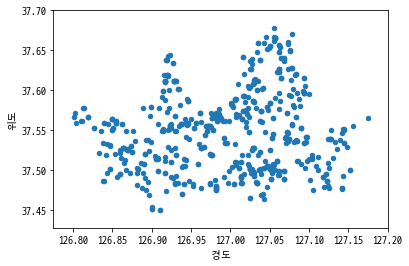

In [45]:
# Pandas 로 scatter plot 그리기
df_31.plot.scatter(x='경도', y='위도')

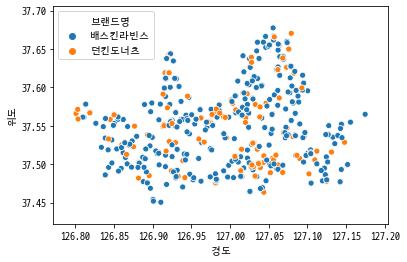

In [46]:
# seaborn 으로 scatter plot 그리기
sns.scatterplot(data=df_31, x='경도', y='위도'
                , hue="브랜드명")

## Folium 사용예제
http://nbviewer.jupyter.org/github/python-visualization/folium/tree/master/examples/

In [47]:
# folium.Map?

In [48]:
geo_df = df_31.copy()

# 지도를 초기화 해줄 때 어디를 중심으로 보여줄지 설정합니다.
# 우리가 가져온 데이터프레임 안에 있는 데이터를 기준으로 출력할 수 있도록 위경도의 평균값을 구해옵니다.
map = folium.Map(location=[geo_df['위도'].mean(), 
                           geo_df['경도'].mean()], 
                           zoom_start=12)

for n in geo_df.index:
    # 팝업에 들어갈 텍스트를 지정해 줍니다.
    popup_name = geo_df.loc[n, '브랜드명'] + ' - ' + geo_df.loc[n, '도로명주소']
    # 브랜드명에 따라 아이콘 색상을 달리해서 찍어줍니다.
    if geo_df['브랜드명'][n] == '던킨도너츠' :
        icon_color = 'pink'
    else:
        icon_color = 'blue'    
    
    folium.Marker([geo_df.loc[n, '위도'], 
                   geo_df.loc[n, '경도']], 
                   popup=popup_name, 
    icon=folium.Icon(color=icon_color)).add_to(map)

map

In [49]:
map = folium.Map(location=[geo_df['위도'].mean(), 
                           geo_df['경도'].mean()], 
                 zoom_start=12, 
                 tiles='Stamen Toner')

for n in geo_df.index:
    # 팝업에 들어갈 텍스트를 지정해 줍니다.
    popup_name = geo_df.loc[n, '브랜드명'] + ' - ' + geo_df.loc[n,'도로명주소']    # 브랜드명에 따라 아이콘 색상을 달리해서 찍어줍니다.
    if geo_df.loc[n,'브랜드명'] == '던킨도너츠' :
        icon_color = 'red'
    else:
        icon_color = 'blue'    
    
    # folium.features.CircleMarker 오류가 날 경우 --> folium.vector_layer.CircleMarker
    folium.CircleMarker(
        location=[geo_df.loc[n,'위도'], 
                  geo_df.loc[n,'경도']],
        radius=3,
        popup=popup_name,
        color= icon_color,
        fill=True,
        fill_color=icon_color
    ).add_to(map)


map

# 뚜레쥬르, 파리바게뜨 매장 위치 분석

In [50]:
df_bread = df_seoul.loc[
    df_seoul['상호명'].str.contains(
        '뚜레쥬르|파리(바게|크라상)') 
       &
       (~df_seoul['상호명'].str.contains(
        '파스쿠찌|잠바주스')
   )
].copy()
# 파스쿠찌 상호명에 파리크라상이 들어가기 때문에 파스쿠찌는 제외합니다.
df_bread.shape

(811, 39)

In [51]:
df_bread['상호명'].value_counts()

파리바게뜨               283
뚜레쥬르                177
파리크라상                23
씨제이뚜레쥬르               2
파리바게뜨성북점              2
회기역파리바게뜨              2
파리바게뜨까페               2
파리바게뜨카페대학로점           2
파리바게뜨월계미성             2
뚜레쥬르개봉역점              1
파리바게뜨동대문구청점           1
뚜레쥬르풍납현대점             1
파리바게뜨역삼초교             1
파리바게뜨선릉아이타워점          1
파리바게뜨암사브라운스톤점         1
파리바게뜨휘경점              1
뚜레쥬르카페안암역점            1
위례아이파크파리바게뜨           1
뚜레쥬르신당역점              1
파리바게뜨회기역점             1
은천갈입구파리바게뜨            1
파리바게뜨양재드림             1
파리바게뜨중계2호점            1
파리바게뜨상도역              1
뚜레쥬르목4동점              1
파리바게뜨여의경도점            1
파리바게뜨은평뉴타운2지구점        1
파리바게뜨연신내              1
뚜레쥬르카페대치점             1
파리바게뜨강동경희             1
                   ... 
파리바게뜨마곡힐스테이트          1
파리바게뜨북가좌점             1
파리바게뜨성수코오롱점           1
파리바게뜨올림픽승리점           1
뚜레쥬르독립문               1
파리바게트17789위례아이파크      1
파리바게트마포               1
파리바게트방화               1
파리바게뜨충무로점             1
파리바게트합정역              1
파리바게뜨창동역동부점     

In [52]:
df_bread.loc[df_bread['상호명'].str.contains('파리(바게|크라상)'), '브랜드명'] = '파리바게뜨'
df_bread.loc[df_bread['상호명'].str.contains('뚜레(쥬|주)르'), '브랜드명'] = '뚜레쥬르'

In [53]:
df_bread_group_count = df_bread['브랜드명'].value_counts()
df_bread_group_count

파리바게뜨    554
뚜레쥬르     257
Name: 브랜드명, dtype: int64

In [54]:
df_bread.shape

(811, 40)

In [55]:
554 + 257

811

In [56]:
df_bread_ratio = df_bread_group_count[0]/df_bread_group_count[1]
print(f'제공된 데이터로 봤을 때 서울에는 파리바게뜨가 뚜레쥬르보다 매장이 {df_31_ratio:.2f}배가량 많습니다.')

제공된 데이터로 봤을 때 서울에는 파리바게뜨가 뚜레쥬르보다 매장이 2.44배가량 많습니다.


In [57]:
734/240

3.058333333333333

#### 하지만, 파리바게뜨 홈페이지에서 서울시특별시의 매장정보를 보면 734개의 매장이 있습니다. 뚜레쥬르는 240개의 매장이 있습니다.
* 파리바게뜨 : https://www.paris.co.kr/store/store_list.jsp?sido=&gugun=&s_sido=%EC%84%9C%EC%9A%B8%ED%8A%B9%EB%B3%84%EC%8B%9C&s_gugun=&s_name=&page=98
* 뚜레쥬르 : https://www.tlj.co.kr:7008/store/search.asp?store_type=&sido=%BC%AD%BF%EF%C6%AF%BA%B0%BD%C3&gugun=&keyword=

In [58]:
df_tou = df_bread[df_bread["브랜드명"] == "뚜레쥬르"]
df_paris = df_bread[df_bread["브랜드명"] == "파리바게뜨"]

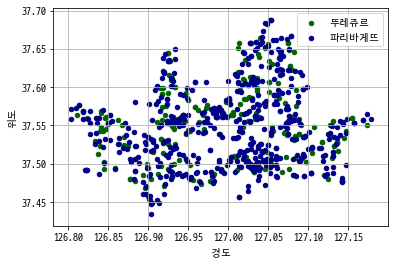

In [59]:
# pandas로 그리기
ax = df_tou[["경도", "위도", "브랜드명"]].plot.scatter(x='경도', y='위도', 
              color='DarkGreen', label='뚜레쥬르')
df_paris[["경도", "위도", "브랜드명"]].plot.scatter(x='경도', y='위도', 
              color='DarkBlue', label='파리바게뜨', 
              ax=ax, grid=True)

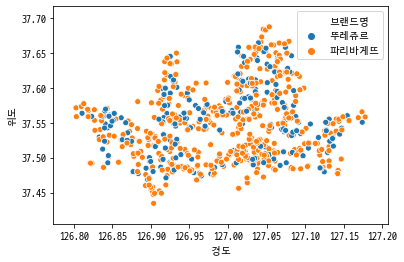

In [60]:
# seaborn 으로 그리기
sns.scatterplot(data=df_bread, x='경도', y='위도', 
                hue='브랜드명')

In [61]:
geo_df = df_bread.copy()

# 지도를 초기화 해줄 때 어디를 중심으로 보여줄지 설정합니다.
# 우리가 가져온 데이터프레임 안에 있는 데이터를 기준으로 출력할 수 있도록 위경도의 평균값을 구해옵니다.
map = folium.Map(location=[geo_df['위도'].mean(), geo_df['경도'].mean()], zoom_start=12)

for n in geo_df.index:
    # 팝업에 들어갈 텍스트를 지정해 줍니다.
    popup_name = geo_df['브랜드명'][n] + ' - ' + geo_df['도로명주소'][n]
    # 브랜드명에 따라 아이콘 색상을 달리해서 찍어줍니다.
    if geo_df['브랜드명'][n] == '뚜레쥬르' :
        icon_color = 'green'
    else:
        icon_color = 'blue'    
    
    folium.Marker([geo_df['위도'][n], 
                   geo_df['경도'][n]], 
                  popup=popup_name, 
                  icon=folium.Icon(color=icon_color)).add_to(map)

map

In [62]:
map = folium.Map(location=[geo_df['위도'].mean(), geo_df['경도'].mean()], zoom_start=12, tiles='Stamen Toner')

for n in geo_df.index:
    # 팝업에 들어갈 텍스트를 지정해 줍니다.
    popup_name = geo_df.loc[n, '브랜드명'] + ' - ' + geo_df.loc[n, '도로명주소']
    # 브랜드명에 따라 아이콘 색상을 달리해서 찍어줍니다.
    if geo_df.loc[n, '브랜드명'] == '뚜레쥬르' :
        icon_color = 'green'
    else:
        icon_color = 'blue'    
      
    # folium.CircleMarker 혹은 folium.features.CircleMarker 오류가 날 경우
    # --> folium.vector_layer.CircleMarker 를 사용합니다.
    folium.CircleMarker(
        location=[geo_df.loc[n,'위도'], 
                  geo_df.loc[n, '경도']],
        radius=3,
        popup=popup_name,
        color= icon_color,
        fill=True,
        fill_color=icon_color
    ).add_to(map)


map

## 스타벅스, 이디야 위치 분석
* [[비즈&빅데이터]스타벅스 '쏠림' vs 이디야 '분산'](http://news.bizwatch.co.kr/article/consumer/2018/01/19/0015)

In [63]:
df_seoul.loc[df_seoul['상호명'].str.contains('스타벅스|starbucks|STARBUCKS'), '상호명'].shape

(502,)

In [64]:
df_seoul.loc[df_seoul['상호명'].str.contains('이디야|ediya|EDIYA'), '상호명'].shape

(501,)

In [65]:
df_cafe = df_seoul[df_seoul['상호명'].str.contains('스타벅스|starbucks|STARBUCKS|이디야|ediya|EDIYA')]
df_cafe.shape

(1003, 39)

In [66]:
df_cafe.loc[df_cafe['상호명'].str.contains('스타벅스|starbucks|STARBUCKS'), '브랜드명'] = '스타벅스'

In [67]:
# df_cafe.loc[~df_cafe['상호명'].str.contains('스타벅스|starbucks|STARBUCKS'), '브랜드명'] = '이디야'

In [68]:
df_cafe['브랜드명'] = df_cafe['브랜드명'].fillna('이디야')

In [69]:
df_cafe.loc[df_cafe['브랜드명'].isnull(), '상호명'].head()

Series([], Name: 상호명, dtype: object)

In [70]:
df_cafe[['상호명','브랜드명']].head()

,상호명,브랜드명
1219,스타벅스,스타벅스
1676,이디야커피,이디야
1946,스타벅스종로3가점,스타벅스
2840,스타벅스,스타벅스
2886,이디야커피,이디야


In [71]:
df_cafe['브랜드명'].value_counts()

스타벅스    502
이디야     501
Name: 브랜드명, dtype: int64

In [72]:
geo_df = df_cafe

In [73]:
map = folium.Map(location=[geo_df['위도'].mean(), geo_df['경도'].mean()], zoom_start=12, tiles='Stamen Toner')

for n in geo_df.index:
    # 팝업에 들어갈 텍스트를 지정해 줍니다.
    popup_name = geo_df.loc[n, '상호명'] + ' - ' + geo_df.loc[n, '도로명주소']
    # 브랜드명에 따라 아이콘 색상을 달리해서 찍어줍니다.
    if geo_df.loc[n, '브랜드명'] == '스타벅스' :
        icon_color = 'green'
    else:
        icon_color = 'blue'    
        
    # folium.CircleMarker 혹은 folium.features.CircleMarker 오류가 날 경우
    # --> folium.vector_layer.CircleMarker 를 사용합니다.
    folium.CircleMarker(
        location=[geo_df.loc[n,'위도'], geo_df.loc[n, '경도']],
        radius=3,
        popup=popup_name,
        color= icon_color,
        fill=True,
        fill_color=icon_color
    ).add_to(map)


map

## 구별 브랜드별 점포수

In [74]:
df_cafe_brand = pd.DataFrame(
    df_cafe.groupby(['시군구명', '브랜드명'])['상호명'].count()
).reset_index()
df_cafe_brand.columns = ['구', '브랜드명', '매장수']
df_cafe_brand

,구,브랜드명,매장수
0,강남구,스타벅스,84
1,강남구,이디야,44
2,강동구,스타벅스,13
3,강동구,이디야,12
4,강북구,스타벅스,5
5,강북구,이디야,11
6,강서구,스타벅스,17
7,강서구,이디야,41
8,관악구,스타벅스,9
9,관악구,이디야,23


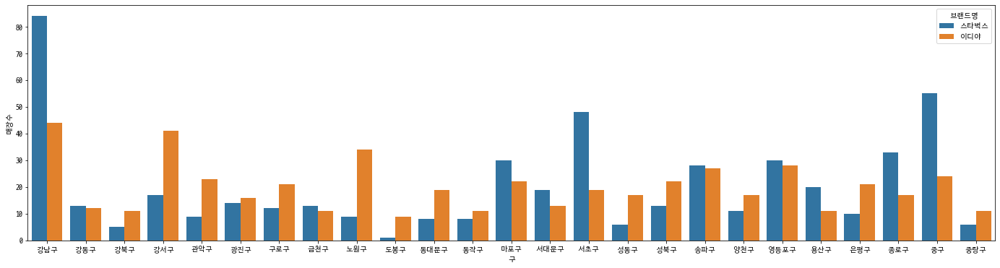

In [75]:
plt.figure(figsize=(24, 6))
sns.barplot(data=df_cafe_brand, x='구', y='매장수', hue='브랜드명')

In [76]:
df_cafe.groupby(['시군구명'])['상호명'].count()

시군구명
강남구     128
강동구      25
강북구      16
강서구      58
관악구      32
광진구      30
구로구      33
금천구      24
노원구      43
도봉구      10
동대문구     27
동작구      19
마포구      52
서대문구     32
서초구      67
성동구      23
성북구      35
송파구      55
양천구      28
영등포구     58
용산구      31
은평구      31
종로구      50
중구       79
중랑구      17
Name: 상호명, dtype: int64

In [77]:
df_cafe_gu = pd.DataFrame(df_cafe.groupby(['시군구명'])['상호명'].count())
df_cafe_gu.head()

,상호명
시군구명,
강남구,128
강동구,25
강북구,16
강서구,58
관악구,32


## choropleth 그리기

* 구별로 매장수를 표현하기 위해 GeoJSON 파일 로드
    * 파일출처 : [southkorea/seoul-maps: Seoul administrative divisions in ESRI Shapefile, GeoJSON and TopoJSON formats.](https://github.com/southkorea/seoul-maps)

In [78]:
import json
geo_path = '../data/07_seoul_municipalities_geo_simple.json'
geo_json = json.load(open(geo_path, encoding='utf-8'))

### 스타벅스 이디야 카페 매장 합계 분포

In [79]:
map = folium.Map(location=[geo_df['위도'].mean(), geo_df['경도'].mean()], 
                 zoom_start=11)
map = folium.Map(location=[geo_df['위도'].mean(), 
                           geo_df['경도'].mean()], 
                 zoom_start=12)

map.choropleth(geo_data = geo_json,
               data = df_cafe_gu['상호명'],
               columns = [df_cafe_brand.index, df_cafe_gu['상호명']],
               fill_color = 'Purples',
               key_on = 'properties.SIG_KOR_NM',
               fill_opacity=0.7,
               line_opacity=0.2,
               highlght=True)


for n in geo_df.index:
    # 팝업에 들어갈 텍스트를 지정해 줍니다.
    popup_name = geo_df.loc[n, '상호명'] + ' - ' + geo_df.loc[n, '도로명주소']
    # 브랜드명에 따라 아이콘 색상을 달리해서 찍어줍니다.
    if geo_df.loc[n, '브랜드명'] == '스타벅스' :
        icon_color = 'green'
    else:
        icon_color = 'blue'    
    
    # folium.CircleMarker 혹은 folium.features.CircleMarker 오류가 날 경우
    # --> folium.vector_layer.CircleMarker 를 사용합니다. 
    folium.CircleMarker(
        location=[geo_df.loc[n,'위도'], geo_df.loc[n, '경도']],
        radius=3,
        popup=popup_name,
        color= icon_color,
        fill=True,
        fill_color=icon_color
    ).add_to(map)

map

### 스타벅스 매장 분포

In [80]:
df_cafe_temp = df_cafe[df_cafe['브랜드명'] == '스타벅스']
df_cafe_starbucks = pd.DataFrame(df_cafe_temp.groupby(['시군구명'])['상호명'].count())
df_cafe_starbucks.columns = ['매장수']
df_cafe_starbucks.head()

,매장수
시군구명,
강남구,84
강동구,13
강북구,5
강서구,17
관악구,9


In [81]:
map = folium.Map(location=[geo_df['위도'].mean(), geo_df['경도'].mean()], 
                 zoom_start=11, tiles='Stamen Toner')

map.choropleth(geo_data = geo_json,
               data = df_cafe_starbucks['매장수'],
               columns = [df_cafe_starbucks.index, df_cafe_starbucks['매장수']],
               fill_color = 'YlGn',
               key_on = 'properties.SIG_KOR_NM',
               fill_opacity=0.7,
               line_opacity=0.2,
               highlight=True)


for n in geo_df.index:
    # 팝업에 들어갈 텍스트를 지정해 줍니다.
    popup_name = geo_df.loc[n, '상호명'] + ' - ' + geo_df.loc[n, '도로명주소']
    # 브랜드명에 따라 아이콘 색상을 달리해서 찍어줍니다.
    if geo_df.loc[n, '브랜드명'] == '스타벅스' :
        icon_color = 'green'    

            
        # folium.CircleMarker 혹은 folium.features.CircleMarker 오류가 날 경우
        # --> folium.vector_layer.CircleMarker 를 사용합니다.
        folium.CircleMarker(
            location=[geo_df.loc[n,'위도'], geo_df.loc[n, '경도']],
            radius=3,
            popup=popup_name,
            color= icon_color,
            fill=True,
            fill_color=icon_color
        ).add_to(map)


map

### 이디야 매장 분포

In [82]:
df_cafe_temp = df_cafe[df_cafe['브랜드명'] == '이디야']
df_cafe_ediya = pd.DataFrame(df_cafe_temp.groupby(['시군구명'])['상호명'].count())
df_cafe_ediya.columns = ['매장수']
df_cafe_ediya.head()

,매장수
시군구명,
강남구,44
강동구,12
강북구,11
강서구,41
관악구,23


In [83]:
map = folium.Map(location=[geo_df['위도'].mean(), geo_df['경도'].mean()], 
                 zoom_start=11, tiles='Stamen Toner')

map.choropleth(geo_data = geo_json,
               data = df_cafe_ediya['매장수'],
               columns = [df_cafe_ediya.index, df_cafe_ediya['매장수']],
               fill_color = 'PuBu',
               key_on = 'properties.SIG_KOR_NM',
               fill_opacity=0.7,
               line_opacity=0.2,
               highlight=True)


for n in geo_df.index:
    # 팝업에 들어갈 텍스트를 지정해 줍니다.
    popup_name = geo_df.loc[n, '상호명'] + ' - ' + geo_df.loc[n, '도로명주소']
    # 브랜드명에 따라 아이콘 색상을 달리해서 찍어줍니다.
    if geo_df.loc[n, '브랜드명'] == '이디야' :
        icon_color = 'blue'    

            
        # folium.CircleMarker 혹은 folium.features.CircleMarker 오류가 날 경우
        # --> folium.vector_layer.CircleMarker 를 사용합니다.
        folium.CircleMarker(
            location=[geo_df.loc[n,'위도'], geo_df.loc[n, '경도']],
            radius=3,
            popup=popup_name,
            color= icon_color,
            fill=True,
            fill_color=icon_color
        ).add_to(map)


map

## 매장수 크기를 반영해 CircleMaker 그리기
### Pandas 의 reshaping data 활용하기

<img src="https://i.imgur.com/IIhU0nF.png">

* 출처 : https://github.com/pandas-dev/pandas/blob/master/doc/cheatsheet/Pandas_Cheat_Sheet.pdf
* reshaping 관련 문서 : https://pandas.pydata.org/pandas-docs/stable/user_guide/reshaping.html

In [84]:
df_cafe_brand.head()

,구,브랜드명,매장수
0,강남구,스타벅스,84
1,강남구,이디야,44
2,강동구,스타벅스,13
3,강동구,이디야,12
4,강북구,스타벅스,5


In [85]:
df_cafe_brand_vs = df_cafe_brand.pivot_table(index='구',
                                             columns='브랜드명',
                                             values='매장수')
df_cafe_brand_vs.columns = ['스타벅스', '이디야']
df_cafe_brand_vs.head()

,스타벅스,이디야
구,,
강남구,84,44
강동구,13,12
강북구,5,11
강서구,17,41
관악구,9,23


In [86]:
df_cafe_brand_vs['매장수비교'] = df_cafe_brand_vs.apply( \
    lambda x : 1 if x['스타벅스'] > x['이디야'] else 0, axis=1)
df_cafe_brand_vs.head()

,스타벅스,이디야,매장수비교
구,,,
강남구,84,44,1
강동구,13,12,1
강북구,5,11,0
강서구,17,41,0
관악구,9,23,0


In [87]:
lng_list = []
lat_list = []
for gu in df_cafe_brand_vs.index:
    lat = df_cafe.loc[df_cafe['시군구명'] == gu, '위도'].mean()
    lng = df_cafe.loc[df_cafe['시군구명'] == gu, '경도'].mean()
    lat_list.append(lat)
    lng_list.append(lng)
    
df_cafe_brand_vs['위도'] = lat_list
df_cafe_brand_vs['경도'] = lng_list
df_cafe_brand_vs.head()

,스타벅스,이디야,매장수비교,위도,경도
구,,,,,
강남구,84,44,1,37.506152,127.045159
강동구,13,12,1,37.540512,127.135966
강북구,5,11,0,37.632224,127.022390
강서구,17,41,0,37.556381,126.837973
관악구,9,23,0,37.481693,126.935638


In [88]:
# CircleMarker의 radius 지정시 다음과 같은 타입오류가 나서 float type 으로 변경
# TypeError: Object of type 'int64' is not JSON serializable

df_cafe_brand_vs['스타벅스'] = df_cafe_brand_vs['스타벅스'].astype(float)
df_cafe_brand_vs['이디야'] = df_cafe_brand_vs['이디야'].astype(float)
df_cafe_brand_vs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25 entries, 강남구 to 중랑구
Data columns (total 5 columns):
스타벅스     25 non-null float64
이디야      25 non-null float64
매장수비교    25 non-null int64
위도       25 non-null float64
경도       25 non-null float64
dtypes: float64(4), int64(1)
memory usage: 1.2+ KB


In [89]:
map = folium.Map(location=[geo_df['위도'].mean(), geo_df['경도'].mean()], 
                 zoom_start=11, tiles='Stamen Toner')

map.choropleth(geo_data = geo_json,
               data = df_cafe_brand_vs['매장수비교'],
               columns = [df_cafe_brand_vs.index, 
                          df_cafe_brand_vs['매장수비교']],
               fill_color = 'BuGn',
               key_on = 'properties.SIG_KOR_NM',
               fill_opacity=0.7,
               line_opacity=0.2,
               highlight=True)


for gu in df_cafe_brand_vs.index:
        
    for cafe in ['스타벅스', '이디야']:
        
        cafe_count = df_cafe_brand_vs.loc[gu, cafe]
        msg = f'{gu} {cafe} 매장수 : {cafe_count:.0f}'
        
        icon_color = 'blue'
        if cafe == '스타벅스': 
            icon_color = 'green'
        
        
        # folium.CircleMarker 혹은 folium.features.CircleMarker 오류가 날 경우
        # --> folium.vector_layer.CircleMarker 를 사용합니다.
        folium.CircleMarker(
            location = [df_cafe_brand_vs.loc[gu,'위도'], 
                      df_cafe_brand_vs.loc[gu, '경도']],
            radius = cafe_count,
            color = icon_color,
            popup = msg,
            fill = True,
            fill_color = icon_color
        ).add_to(map)

map

#### 지도 출력 시 색상 참고
* http://colorbrewer2.org/

## folium 공부를 위해 더 읽어보면 좋을 것 
* https://nbviewer.jupyter.org/github/python-visualization/folium/tree/master/examples/
* https://python-visualization.github.io/folium/quickstart.html#Choropleth-maps
* [PinkWink의 데이터 사이언스 관련 책 - 파이썬으로 데이터 주무르기](https://pinkwink.kr/1070)

## 카토그램 
* [총선⑫ 인구 비례로 본 당선 지도…‘카토그램’으로 살펴본 당선 현황 > 데이터룸 > 정치 > 뉴스 | KBSNEWS](http://news.kbs.co.kr/news/view.do?ncd=3264019)
* [The Housing Value of Every County in the U.S. - Metrocosm](http://metrocosm.com/the-housing-value-of-every-county-in-the-u-s/)